# WaffleHacks 2023 - Fundamentals of OpenCV

### Instructed by Kevin Gauld


<div>
<img src="https://opencv.org/wp-content/uploads/2020/07/OpenCV_logo_black-2.png" width="100"/>
</div>

# What is OpenCV?

* Open Source Computer Vision Library
* Started by Intel in 2000, moved to Willow Garage then back to Intel
* Provides a standard interface for CV modules
* Contains 2500+ optimized algorithms
* Estimated over 18 million lifetime downloads
* Examples of applications: Stitching together streetview images, Allowing for robots to perceive and react to objects, Checking runways for debris, basically anything that uses imaging
* Supported in C++, Python, Java, and Matlab on Windows, Linux, Android, and MacOS. The original implementation is done in C++
* Supports GPU acceleration through CUDA

In [57]:
import cv2

import numpy as np

from IPython.display import clear_output, Image, display
import ipywidgets

from PIL import Image

import matplotlib.pyplot as plt
%matplotlib notebook

# Starting with Images

OpenCV can be used on basically any visual data! We'll primarily look at images, but the library also has functionality allowing for handling of videos. First, let's load in some data...

<IPython.core.display.Javascript object>


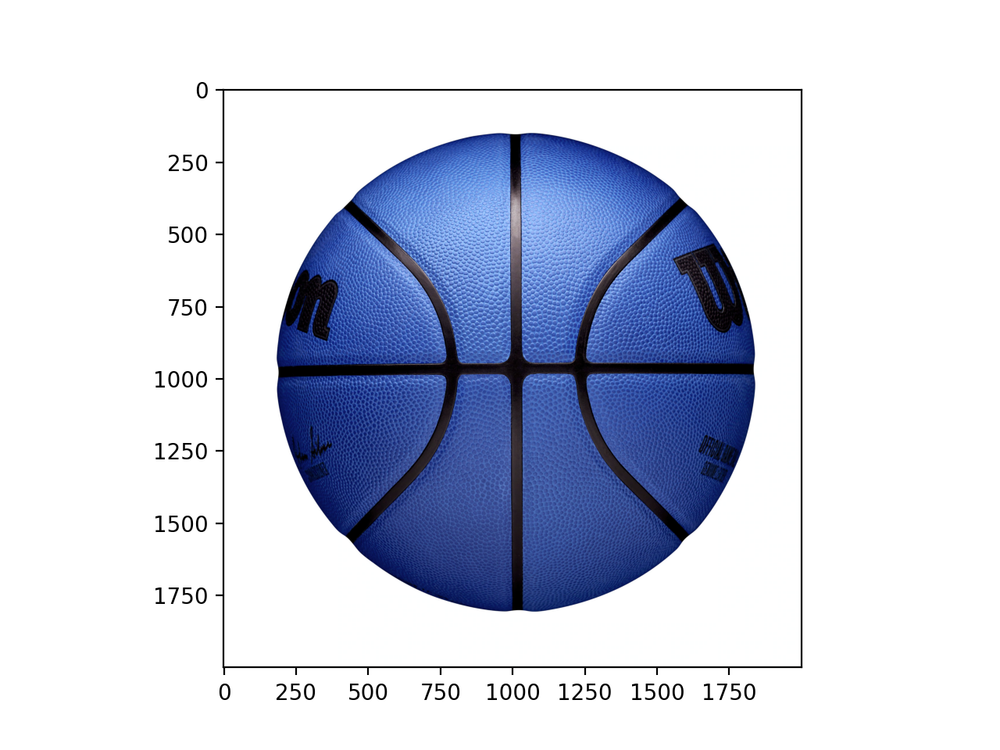

In [2]:
ball = cv2.imread('images/ball.png')

plt.figure()
plt.imshow(ball)
plt.show()

<IPython.core.display.Javascript object>


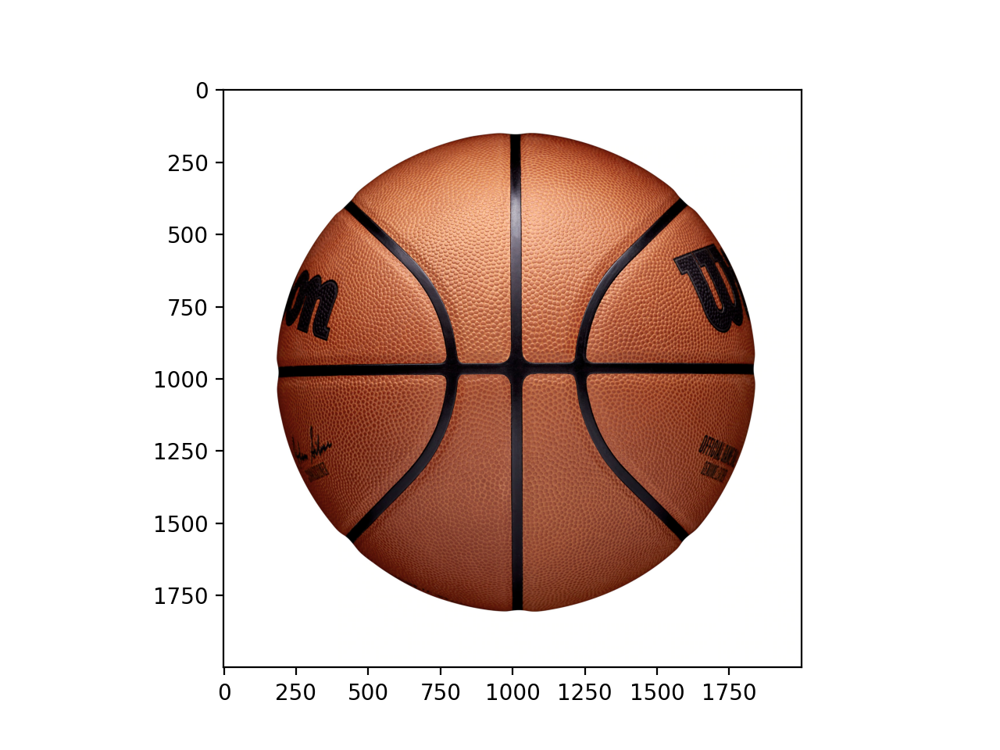

In [3]:
ball = cv2.imread('images/ball.png')

plt.figure()
plt.imshow(cv2.cvtColor(ball, cv2.COLOR_BGR2RGB))
plt.show()

### Can we detect the location of the ball?

Yes! We need to use color thresholding-- maybe look at the location of the non-white area?

<IPython.core.display.Javascript object>


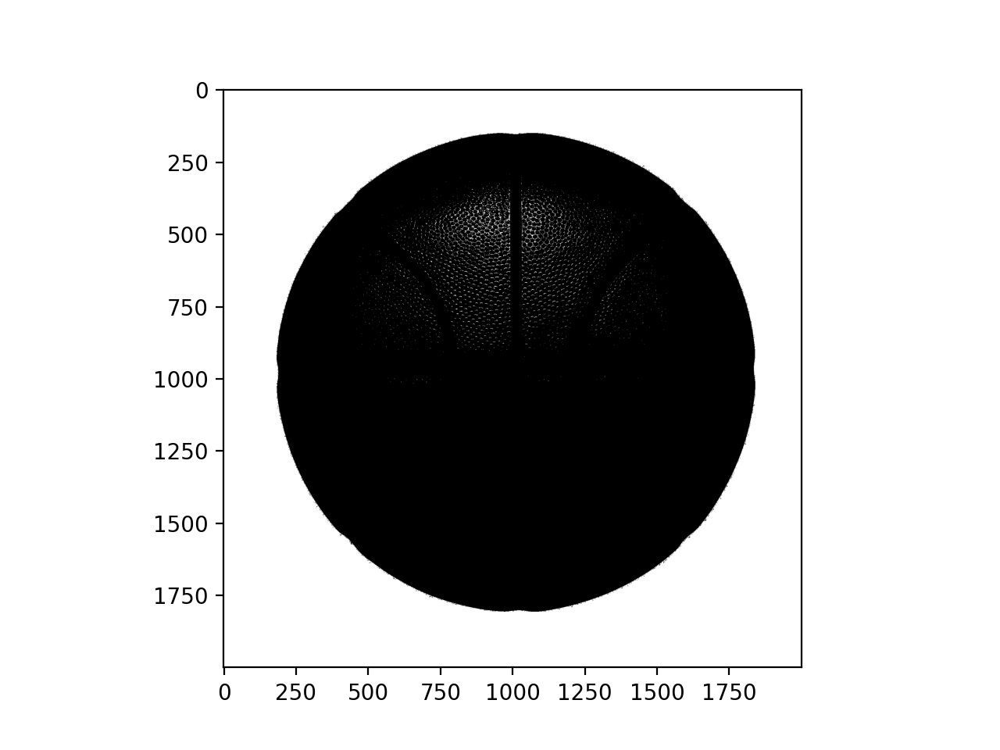

In [4]:
lower_color = np.array([0,0,0],  dtype='uint8')
upper_color = np.array([254,254,254], dtype='uint8')
mask = 255-cv2.inRange(ball, lower_color, upper_color)

plt.figure()
plt.imshow(cv2.cvtColor(mask, cv2.COLOR_BGR2RGB))
plt.show()

<IPython.core.display.Javascript object>


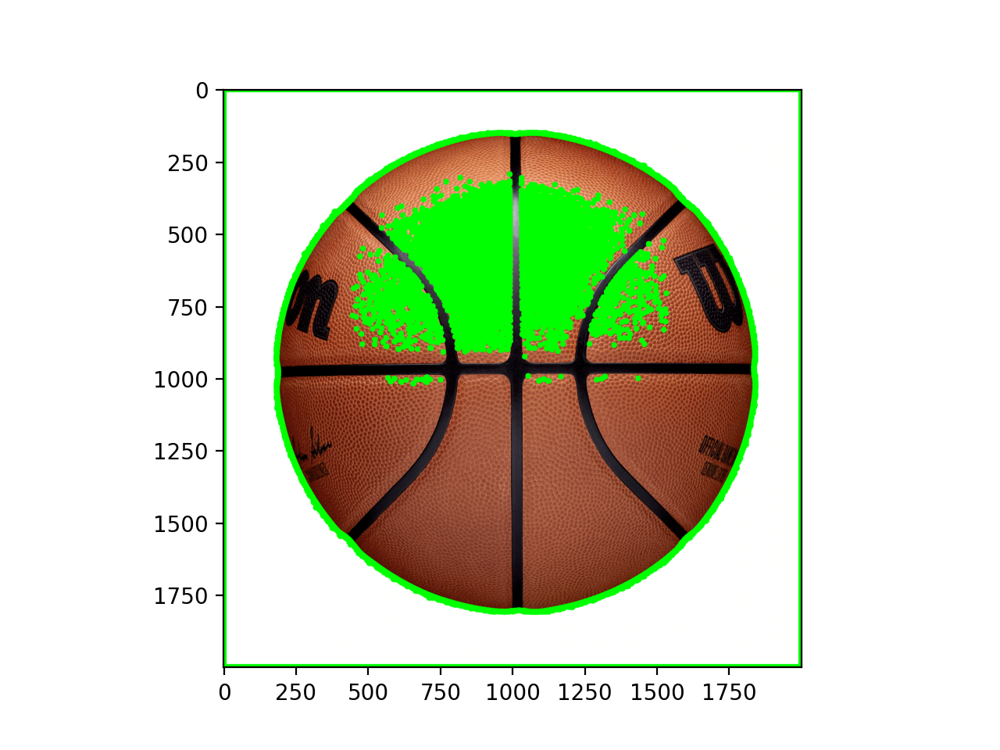

In [5]:
ret, thresh = cv2.threshold(mask, 127, 255, 0)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    cv2.drawContours(ball, contour, -1, (0, 255, 0), 20)

plt.figure()
plt.imshow(cv2.cvtColor(ball, cv2.COLOR_BGR2RGB))
plt.show()

### Let's fix the center area

We can take the original mask, and **erode** all of the edges to get rid of small features. Since we don't want to decrease the size of our primary contour, we then **dilate** back out to bring the main contour back to the right size.

<IPython.core.display.Javascript object>


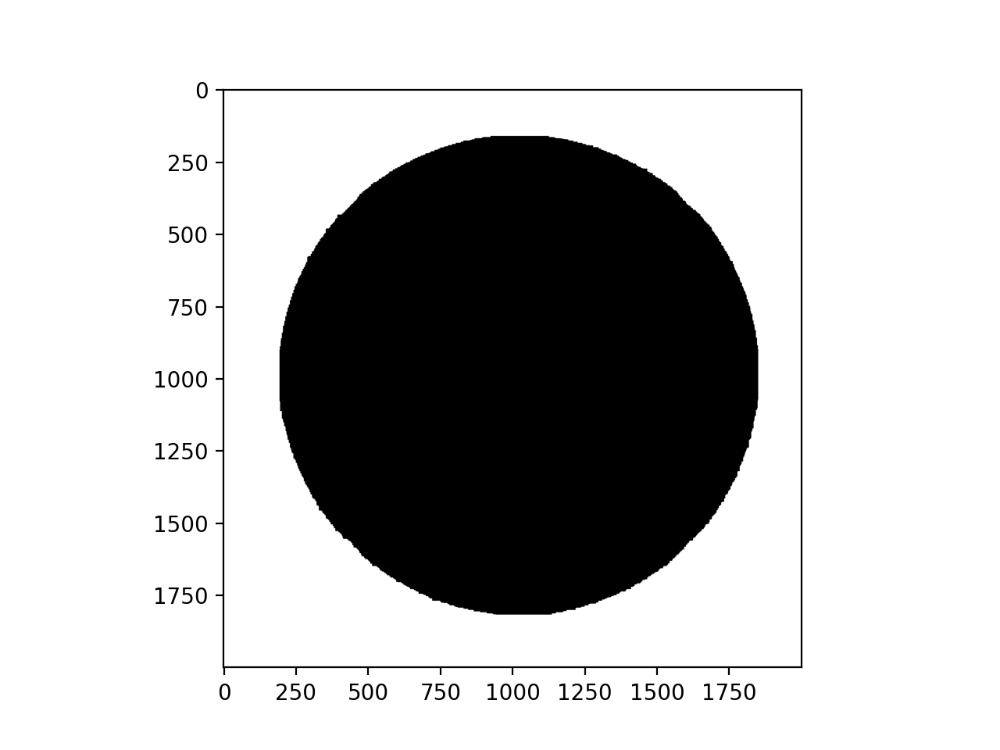

In [6]:
ball = cv2.imread('images/ball.png')

lower_color = np.array([0,0,0],  dtype='uint8')
upper_color = np.array([254,254,254], dtype='uint8')
mask = 255-cv2.inRange(ball, lower_color, upper_color)

kernel = np.ones((10,10),np.uint8)
erosion = cv2.erode(mask,kernel,iterations=10)
dilation = cv2.dilate(erosion,kernel,iterations=10)

plt.figure()
plt.imshow(cv2.cvtColor(dilation, cv2.COLOR_BGR2RGB))
plt.show()

<IPython.core.display.Javascript object>


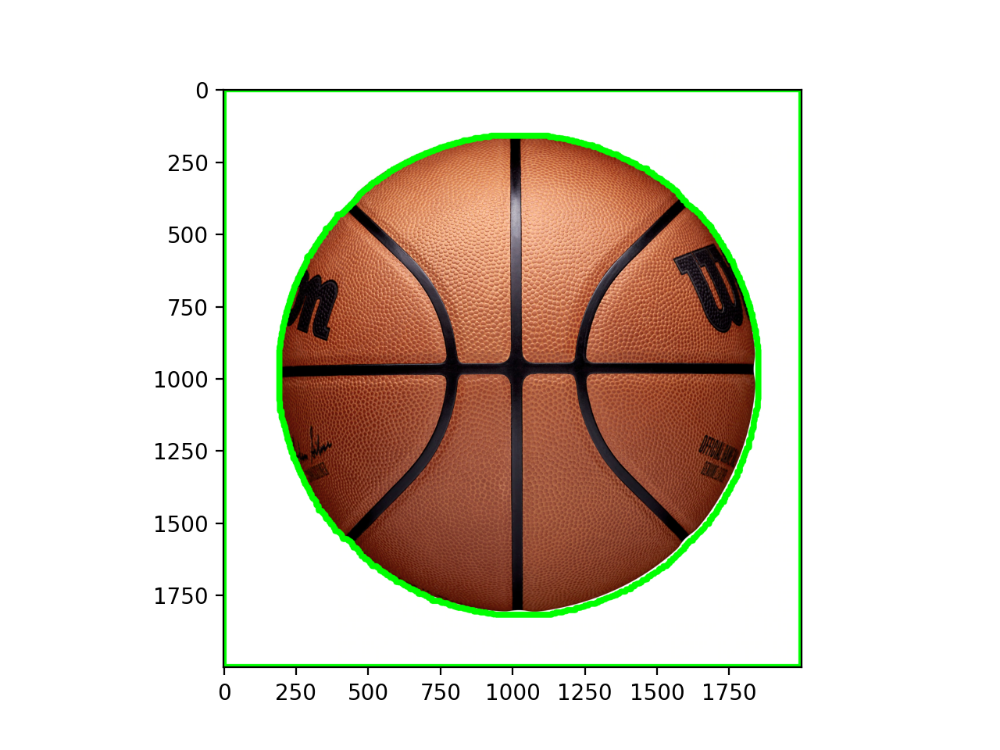

In [7]:
ball = cv2.imread('images/ball.png')

ret, thresh = cv2.threshold(dilation, 127, 255, 0)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    cv2.drawContours(ball, contour, -1, (0, 255, 0), 20)

plt.figure()
plt.imshow(cv2.cvtColor(ball, cv2.COLOR_BGR2RGB))
plt.show()

### Can we find the center of the ball?

Yep! We can use the center of mass of the image, or where the average of the contour is located. We need to use the eroded and dilated image to do this though, as otherwise the averaging could be messed up by the gaps in the image.

<IPython.core.display.Javascript object>


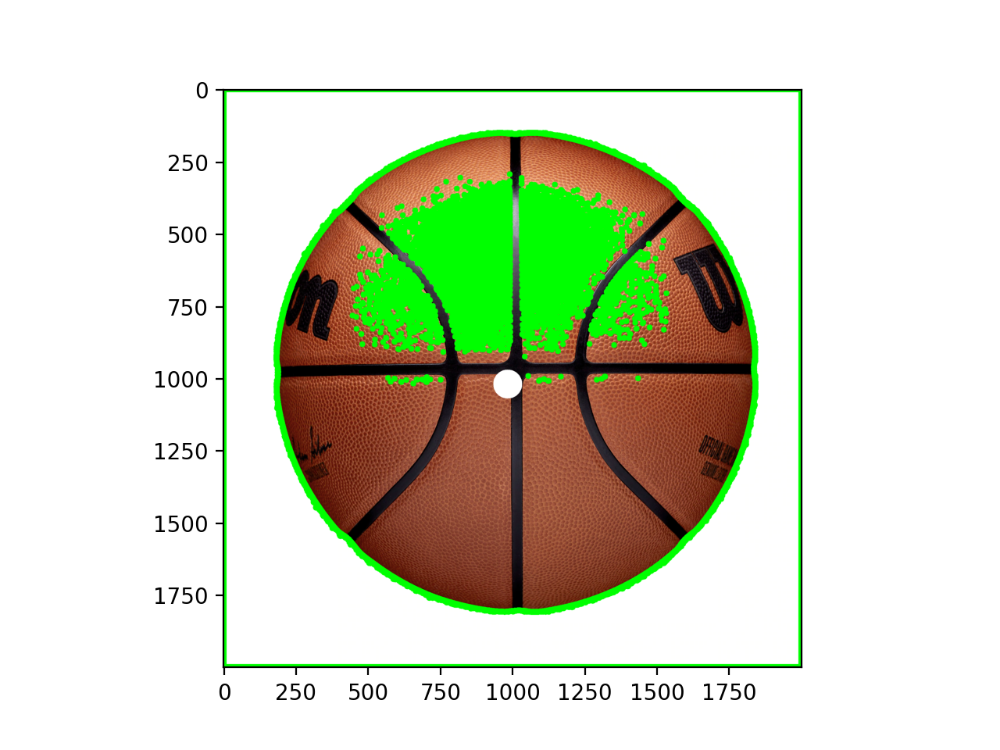

In [8]:
ball = cv2.imread('images/ball.png')

ret, thresh = cv2.threshold(mask, 127, 255, 0)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    cv2.drawContours(ball, contour, -1, (0, 255, 0), 20)

#calculate moments of binary image
M = cv2.moments(thresh)
 
# calculate x,y coordinate of center
cX = int(M["m10"] / M["m00"])
cY = int(M["m01"] / M["m00"])
 
# highlight the center
cv2.circle(ball, (cX, cY), 50, (255, 255, 255), -1)

plt.figure()
plt.imshow(cv2.cvtColor(ball, cv2.COLOR_BGR2RGB))
plt.show()

<IPython.core.display.Javascript object>


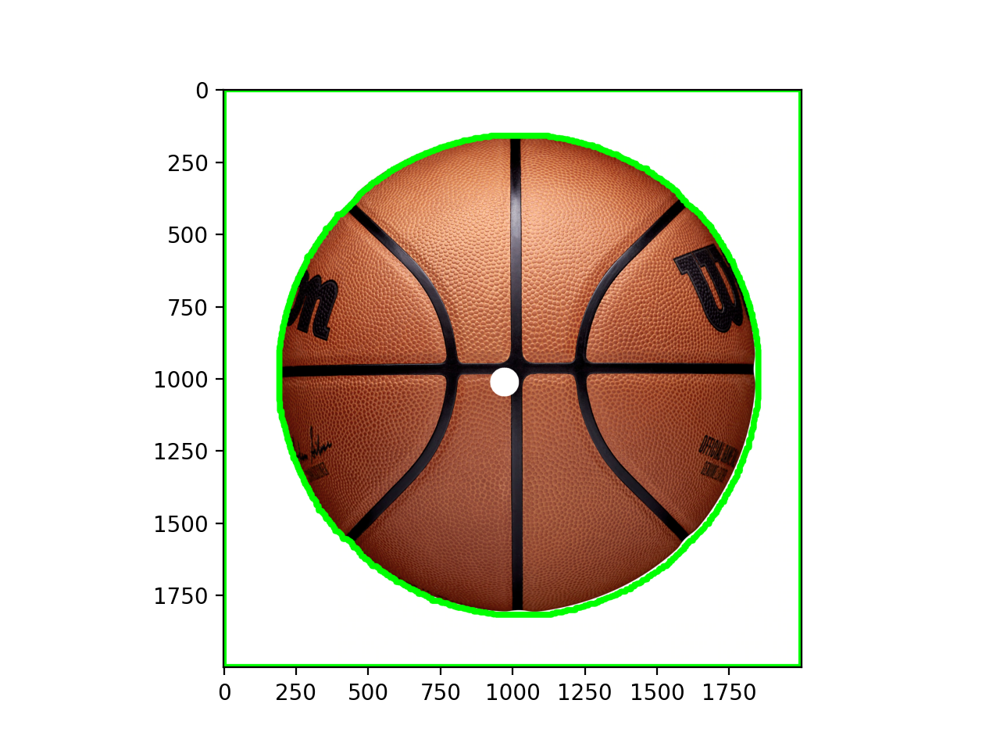

In [13]:
ball = cv2.imread('images/ball.png')

ret, thresh = cv2.threshold(dilation, 127, 255, 0)
contours, _ = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)

for contour in contours:
    cv2.drawContours(ball, contour, -1, (0, 255, 0), 20)

#calculate moments of binary image
M = cv2.moments(thresh)
 
# calculate x,y coordinate of center
cX = int(M["m10"] / M["m00"])
cY = int(M["m01"] / M["m00"])
 
# highlight the center
cv2.circle(ball, (cX, cY), 50, (255, 255, 255), -1)

plt.figure()
plt.imshow(cv2.cvtColor(ball, cv2.COLOR_BGR2RGB))
plt.show()

# Face Detection

* OpenCV uses something known as Haar feature-based cascades for face location detection
* Each kernel below is a "feature"
* Kernels are applied to a wide dataset of face and non-face images, then a model is trained based on the resultant data
* The training step decides on which features are actually indicative of a face, then saves them
    * For OpenCV's face classifier, there are 6000 features found from a search over 160000 features
* Chosen features are not all always applied to check for faces, but are instead cascaded, so non face regions are analyzed first and ignored in later checks

![](https://docs.opencv.org/3.4/haar_features.jpg)

![](https://docs.opencv.org/3.4/haar.png)

In [10]:
def detect_faces(frame, draw=True):
    # Load in the cascade model
    face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')
    # Convert the frame to grayscale
    gray = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)
    # Find the faces within the image
    faces = face_cascade.detectMultiScale(gray, 1.1, 4)
    # If necessary, draw bounding boxes for the faces
    if draw:
        for (x, y, w, h) in faces:
            cv2.rectangle(frame, (x, y), (x+w, y+h), (255, 0, 0), 2)
    # Return the bounding box locations
    return faces

<IPython.core.display.Javascript object>


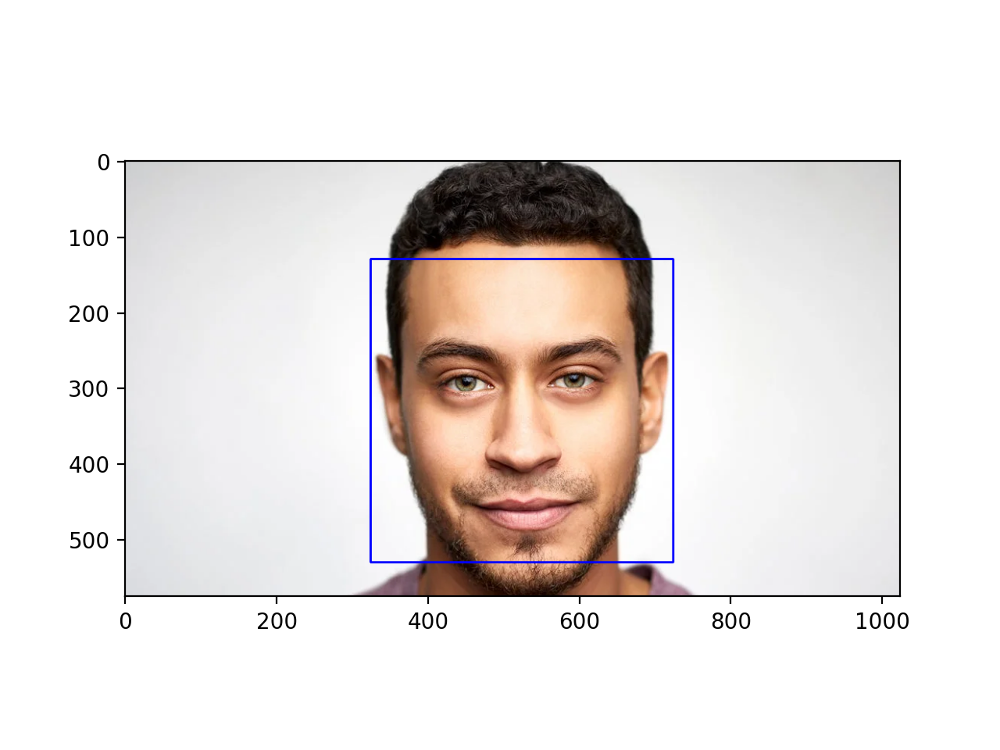

In [16]:
face = cv2.imread('images/singleface.png')
detect_faces(face)

plt.figure()
plt.imshow(cv2.cvtColor(face, cv2.COLOR_BGR2RGB))
plt.show()

<IPython.core.display.Javascript object>


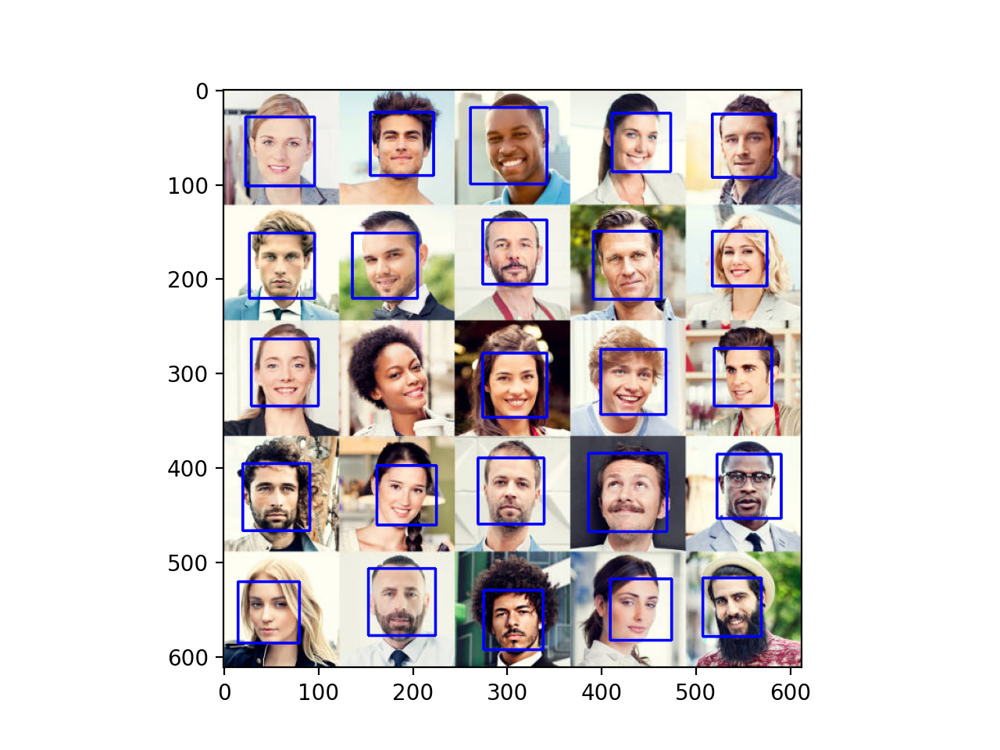

In [30]:
multiface = cv2.imread('images/multiface.png')
detect_faces(multiface)

plt.figure()
plt.imshow(cv2.cvtColor(multiface, cv2.COLOR_BGR2RGB))
plt.show()

# Video Streaming - Face Tracking App

I won't go into this too much, just a way to stream video in a Jupyter notebook (different from a standalone python file unfortunately)

Uncomment line 18 to perform face detection on the frame in real time!

In [ ]:
# VideoCapture takes a paraeter of 1 here bc I'm using a secondary
# webcam. You should change to 0 to use your default webcam.
video = cv2.VideoCapture(1)

# Creates the image widget to display in
display_handle=display(None, display_id=True)
image_widget = ipywidgets.Image(format='jpeg')

while True:
    try:
        # Clears the last image
        clear_output(wait=True)
        
        # Reads the next frame from the video feed
        _, frame = video.read()
        
        # Detect faces in the frame
        # faces = detect_faces(frame)
        
        # Displays the image within the frame
        lines, columns, _ =  frame.shape
        frame = cv2.resize(frame, (int(columns/4), int(lines/4))) 
        image_widget.value =cv2.imencode('.jpeg', frame)[1].tobytes()
        display(image_widget)
    
    except KeyboardInterrupt:
        # Closes the video on interrupt
        video.release()
        break

# HDR Imaging

Adapted from here: https://docs.opencv.org/3.4/d2/df0/tutorial_py_hdr.html

### What is HDR Imaging?

* Cameras are limited to a "dynamic range" defining the range of values which can be read out by the detector
* At any exposure, there is some data loss outside of this dynamic range, where some areas are darker than the low bound of the dynamic range and other areas are brighter
    * This leads to saturation on the highs and lows of an image
* By using a different exposure time, different areas of the image are saturated, giving a different dynamic range
    * Dynamic ranges of different exposures can be merged together to create a single image with "High Dynamic Range", which is just a greater dynamic range than the sensor can usually achieve
* Most phone cameras do this automatically!

In [24]:
# Loading exposure images into a list
img_fn = ["images/hdr+4.jpeg", 
          "images/hdr+2.jpeg", 
          "images/hdr-2.jpeg", 
          "images/hdr-4.jpeg"]
img_list = [cv2.imread(fn) for fn in img_fn]
exposure_times = np.array([15.0, 2.5, 0.25, 0.0333], dtype=np.float32)

<IPython.core.display.Javascript object>


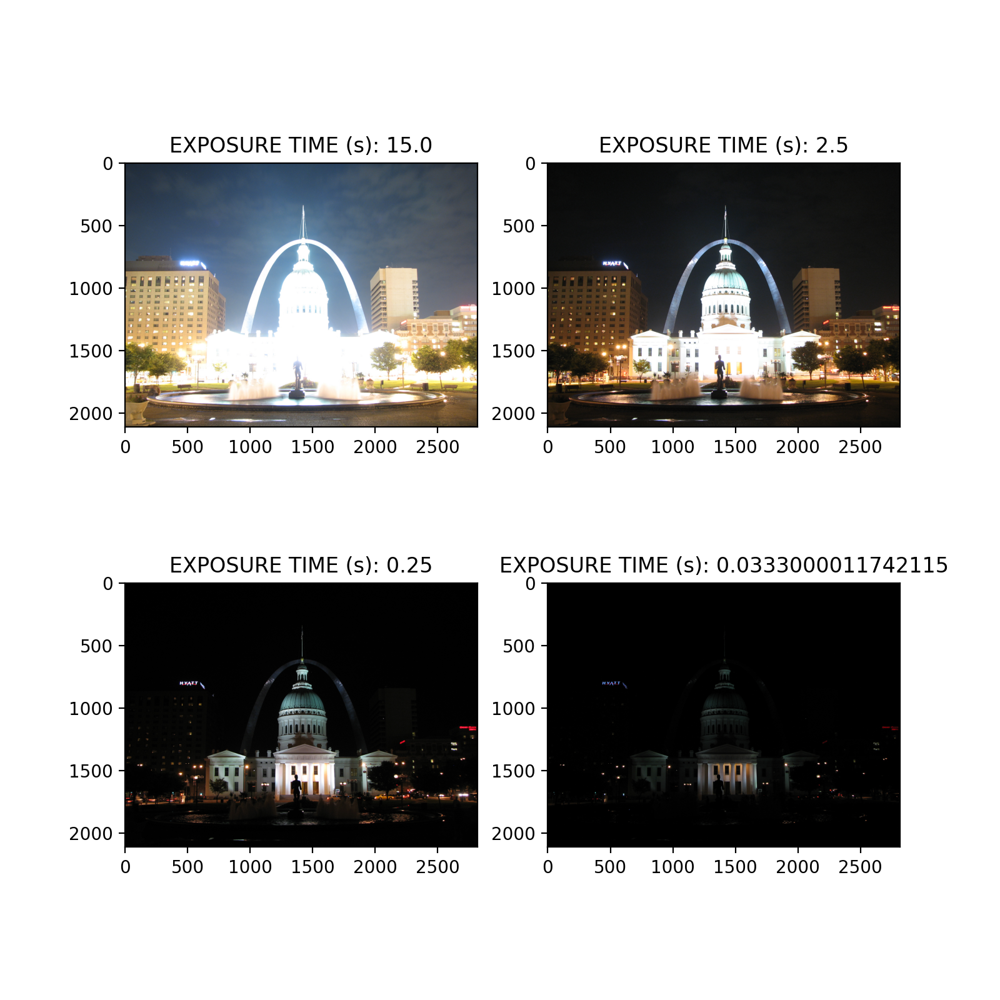

In [35]:
fig, axs = plt.subplots(2,2,figsize=(8,8))
axs = axs.flatten()
for k in range(len(img_list)):
    axs[k].imshow(cv2.cvtColor(img_list[k], cv2.COLOR_BGR2RGB))
    axs[k].set_title(f"EXPOSURE TIME (s): {exposure_times[k]}")
plt.show()

### Debevec Algorithm

![](https://media.discordapp.net/attachments/730567294102667324/1122333896613302362/image.png?width=2394&height=454)

[https://www.pauldebevec.com/Research/HDR/debevec-siggraph97.pdf](https://www.pauldebevec.com/Research/HDR/debevec-siggraph97.pdf)

In [26]:
# Merge exposures to HDR image
merge_debevec = cv2.createMergeDebevec()
hdr_debevec = merge_debevec.process(img_list, times=exposure_times.copy())

In [43]:
# Tonemap HDR image
tonemap1 = cv2.createTonemap(gamma=4)
res_debevec = tonemap1.process(hdr_debevec.copy())
res_debevec_8bit = np.clip(res_debevec*255, 0, 255).astype('uint8')

<IPython.core.display.Javascript object>


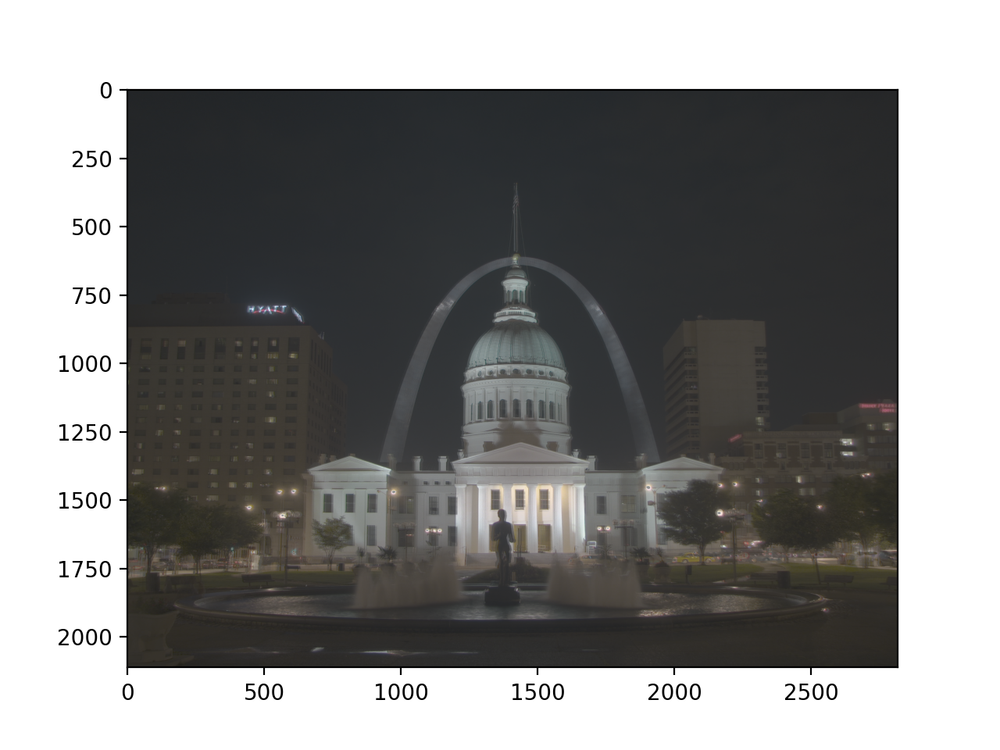

In [45]:
plt.figure()
plt.imshow(cv2.cvtColor(res_debevec_8bit, cv2.COLOR_BGR2RGB))
plt.show()

## What is image blending?

<div>
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987841504045322270/unknown.png" width="500">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987841643224903750/unknown.png" width="500">

</div>


## Gaussian Pyramids


<div>
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987842317769666700/unknown.png" width="500">
</div>

### Effective Downsampling

<div>
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987843367176138884/unknown.png" width="500">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987839037836496956/unknown.png" width="500">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987842748071673876/unknown.png" width="500">

</div>

### Results for apple and orange


<div>
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987844582421184523/unknown.png" width="800">

</div>


## Laplacian Pyramid

<div>
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987845301681401927/unknown.png" width="800">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987845385827516416/unknown.png" width="600">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987845617512501248/unknown.png" width="1000">
</div>


## Blending!!

<div>
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987846820803805254/unknown.png" width="800">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987846884930494504/unknown.png" width="1000">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987847038467194920/unknown.png" width="1000">
    <img src="https://cdn.discordapp.com/attachments/730567294102667324/987847154657808414/unknown.png" width="1000">
</div>


In [58]:
def resize(image: np.ndarray, size) -> np.ndarray:
    '''
    Convert an image to the specified size (height, width) using bicubic
    interpolation.
    '''
    return _resize_channel(image, size) if image.ndim == 2 else np.dstack([
        _resize_channel(chan, size) for chan in image.transpose(2, 0, 1)
    ])
def _resize_channel(chan: np.ndarray, size) -> np.ndarray:
    '''
    Resize a single image channel using bicubic interpolation
    '''
    return np.asarray(Image.fromarray(chan).resize(size[::-1], Image.Resampling.BICUBIC))

A = cv2.imread('images/A.png')
B = cv2.imread('images/B.png')

In [59]:
# generate Gaussian pyramid for A
G = A.copy()
gpA = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gpA.append(G)

# generate Gaussian pyramid for B
G = B.copy()
gpB = [G]
for i in range(6):
    G = cv2.pyrDown(G)
    gpB.append(G)

<IPython.core.display.Javascript object>


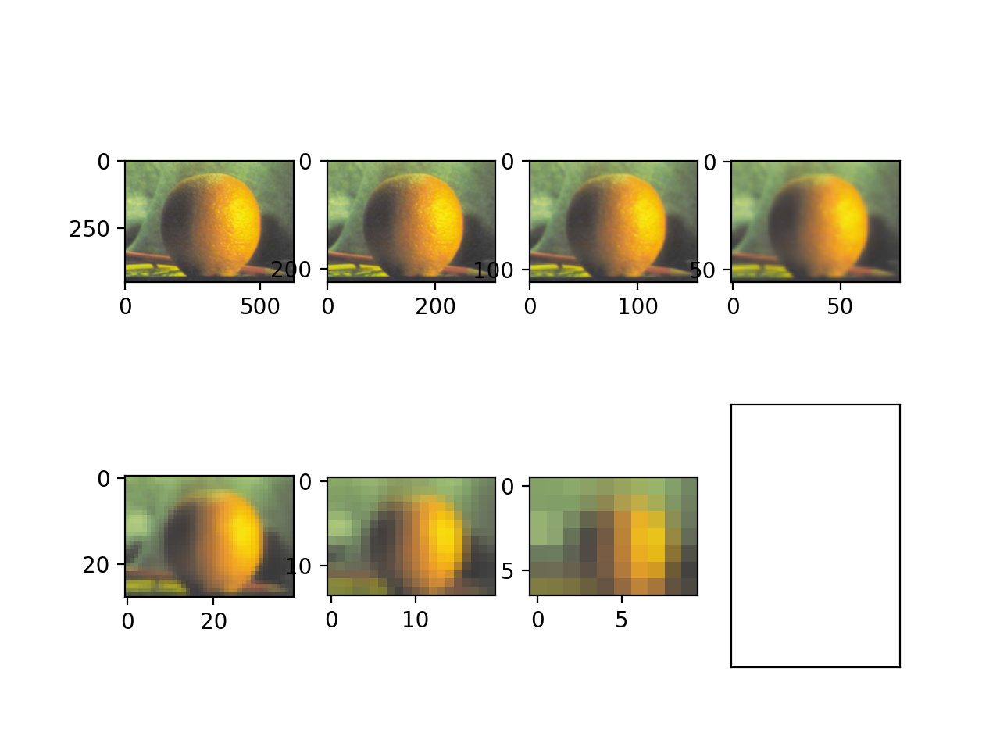

In [78]:
fig,axs = plt.subplots(2,len(gpB)//2+1)
axs = axs.flatten()
for k in range(len(gpB)):
    axs[k].imshow(cv2.cvtColor(gpB[k], cv2.COLOR_BGR2RGB))

axs[-1].set_xticks([])
axs[-1].set_yticks([])
plt.show()

In [62]:
# generate Laplacian Pyramid for A
lpA = [gpA[5]]
for i in range(5,0,-1):
    GE = resize(cv2.pyrUp(gpA[i]), gpA[i-1].shape[:-1])
    L = cv2.subtract(gpA[i-1],GE)
    lpA.append(L)

# generate Laplacian Pyramid for B
lpB = [gpB[5]]
for i in range(5,0,-1):
    GE = resize(cv2.pyrUp(gpB[i]), gpB[i-1].shape[:-1])
    L = cv2.subtract(gpB[i-1],GE)
    lpB.append(L)

<IPython.core.display.Javascript object>


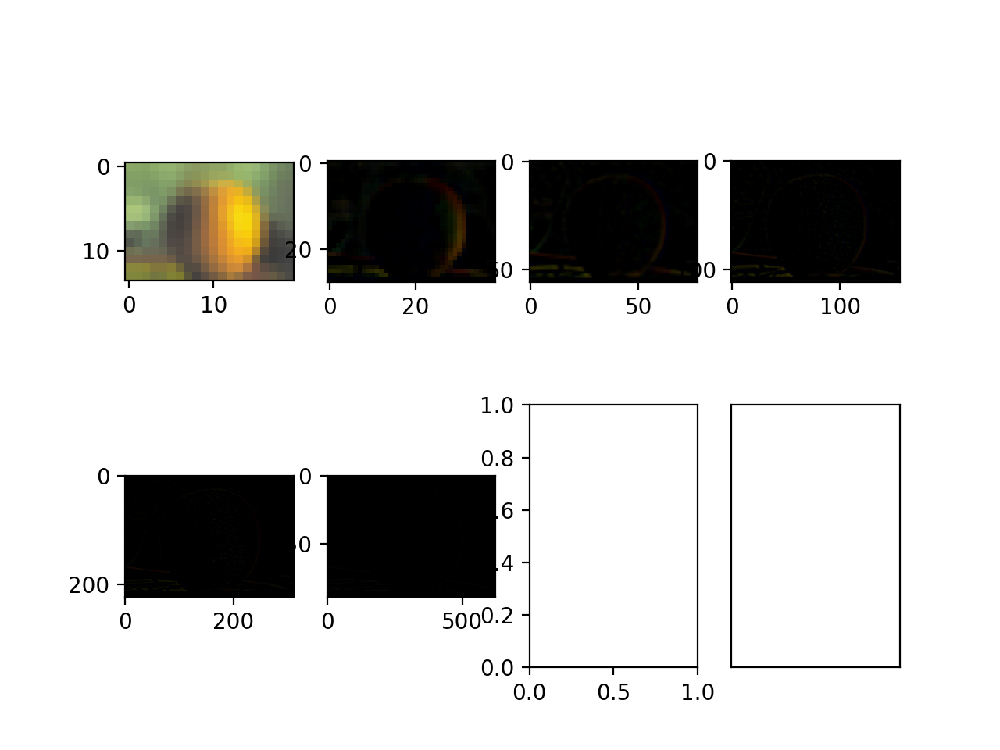

In [80]:
fig,axs = plt.subplots(2,len(lpB)//2+1)
axs = axs.flatten()
for k in range(len(lpB)):
    axs[k].imshow(cv2.cvtColor(lpB[k], cv2.COLOR_BGR2RGB))

axs[-1].set_xticks([])
axs[-1].set_yticks([])
plt.show()

In [63]:
# Now add left and right halves of images in each level
LS = []
for la,lb in zip(lpA,lpB):
    rows,cols,dpt = la.shape
    ls = np.hstack((la[:,0:cols//2], lb[:,cols//2:]))
    LS.append(ls)

<IPython.core.display.Javascript object>


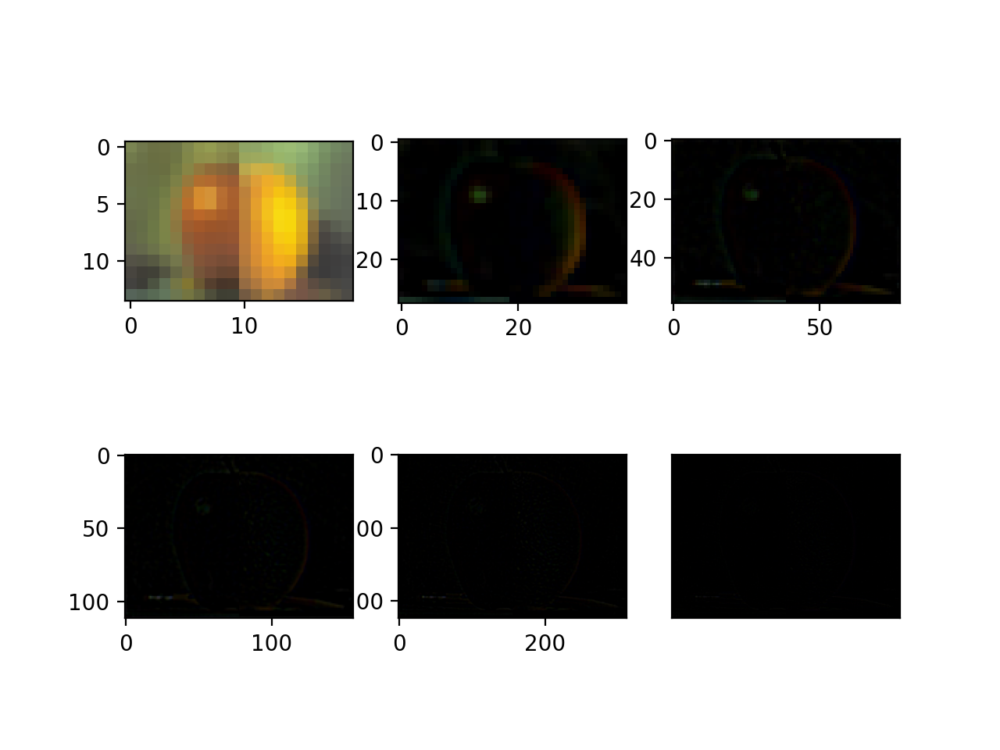

In [82]:
fig,axs = plt.subplots(2,len(LS)//2)
axs = axs.flatten()
for k in range(len(LS)):
    axs[k].imshow(cv2.cvtColor(LS[k], cv2.COLOR_BGR2RGB))

axs[-1].set_xticks([])
axs[-1].set_yticks([])
plt.show()

In [65]:
# now reconstruct
ls_ = LS[0]
for i in range(1,6):
    ls_ = resize(cv2.pyrUp(ls_), LS[i].shape[:-1])
    ls_ = cv2.add(ls_, LS[i])
    
# image with direct connecting each half
real = np.hstack((A[:,:cols//2],B[:,cols//2:]))

<IPython.core.display.Javascript object>


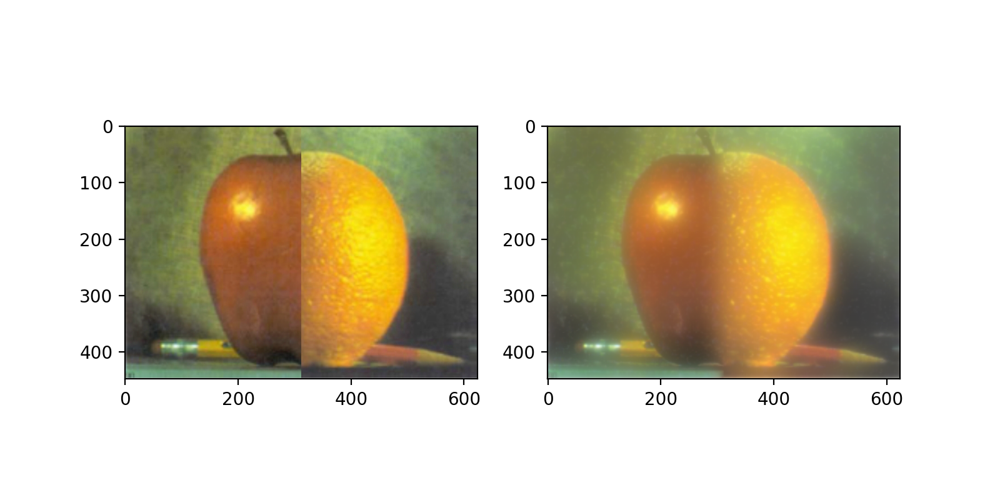

In [73]:
fig, axs = plt.subplots(1,2,figsize=(8,4))
axs[0].imshow(cv2.cvtColor(real, cv2.COLOR_BGR2RGB))
axs[1].imshow(cv2.cvtColor(ls_, cv2.COLOR_BGR2RGB))
plt.show()